<a href="https://colab.research.google.com/github/sonamoni927/Advanced-potato-Disease-detection/blob/main/Potato_Plant_Disease_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import random
from PIL import Image
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import img_to_array, load_img
# ignore warnings
import warnings
warnings.filterwarnings("ignore")


In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("aarishasifkhan/plantvillage-potato-disease-dataset")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'plantvillage-potato-disease-dataset' dataset.
Path to dataset files: /kaggle/input/plantvillage-potato-disease-dataset


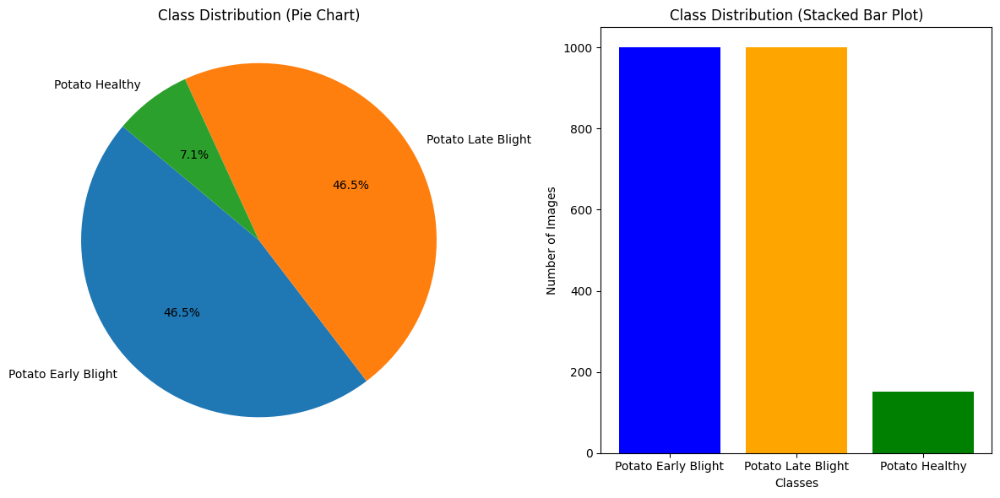

In [ ]:
# Define the path to the dataset and the class folders
dataset_dir = '/kaggle/input/plantvillage-potato-disease-dataset/PlantVillage'
class_dirs = ['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']
class_labels = ['Potato Early Blight', 'Potato Late Blight', 'Potato Healthy']

# Calculate number of images in each class
class_counts = []
for class_dir in class_dirs:
    class_path = os.path.join(dataset_dir, class_dir)
    num_images = len(os.listdir(class_path))
    class_counts.append(num_images)

# Calculate percentages for pie chart
total_images = sum(class_counts)
percentages = [(count / total_images) * 100 for count in class_counts]

# Create figure and subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Pie chart
ax1.pie(percentages, labels=class_labels, autopct='%1.1f%%', startangle=140)
ax1.set_title('Class Distribution (Pie Chart)')
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Stacked bar plot
ax2.bar(class_labels, class_counts, color=['blue', 'orange', 'green'])
ax2.set_title('Class Distribution (Stacked Bar Plot)')
ax2.set_xlabel('Classes')
ax2.set_ylabel('Number of Images')

# Adjust layout
plt.tight_layout()

# Show plots
plt.show()


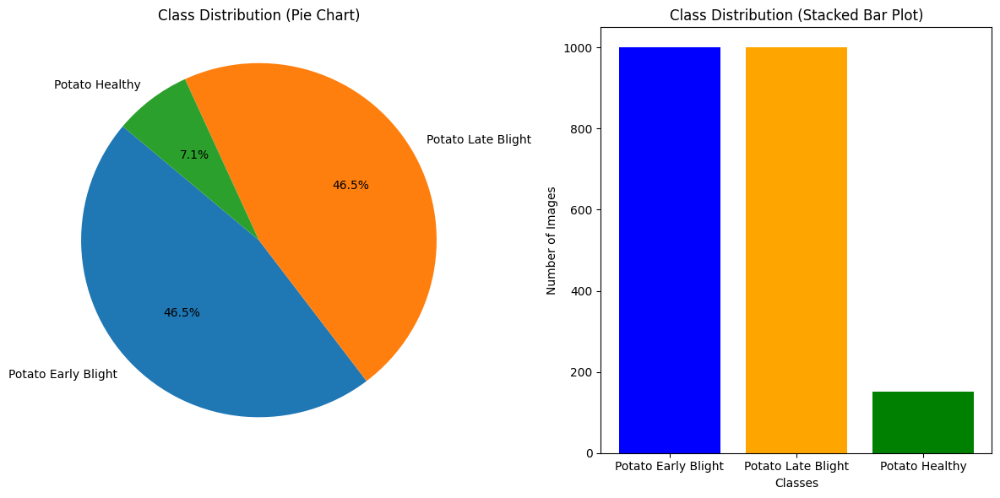

In [ ]:
# Define the path to the dataset and the class folders
dataset_dir = os.path.join(path, 'PlantVillage')
class_dirs = ['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']
class_labels = ['Potato Early Blight', 'Potato Late Blight', 'Potato Healthy']

# Calculate number of images in each class
class_counts = []
for class_dir in class_dirs:
    class_path = os.path.join(dataset_dir, class_dir)
    num_images = len(os.listdir(class_path))
    class_counts.append(num_images)

# Calculate percentages for pie chart
total_images = sum(class_counts)
percentages = [(count / total_images) * 100 for count in class_counts]

# Create figure and subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Pie chart
ax1.pie(percentages, labels=class_labels, autopct='%1.1f%%', startangle=140)
ax1.set_title('Class Distribution (Pie Chart)')
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Stacked bar plot
ax2.bar(class_labels, class_counts, color=['blue', 'orange', 'green'])
ax2.set_title('Class Distribution (Stacked Bar Plot)')
ax2.set_xlabel('Classes')
ax2.set_ylabel('Number of Images')

# Adjust layout
plt.tight_layout()

# Show plots
plt.show()

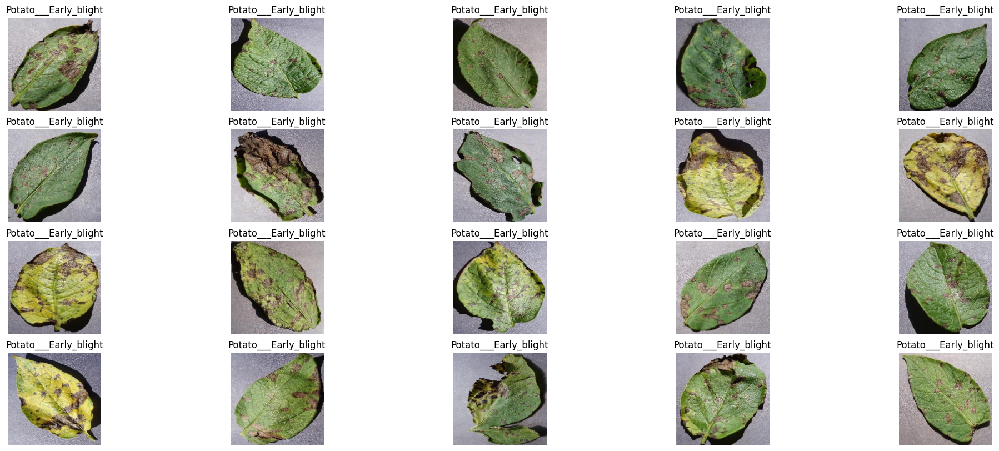

In [ ]:
# Define the path to the dataset and the class folder
dataset_dir = os.path.join(path, 'PlantVillage')
class_dir = 'Potato___Early_blight'
class_path = os.path.join(dataset_dir, class_dir)

# Get the first 20 image filenames
image_files = os.listdir(class_path)[:20]

# Plot the images
plt.figure(figsize=(25, 10))  # Adjusted figsize to accommodate 20 images
for i, image_file in enumerate(image_files):
    img_path = os.path.join(class_path, image_file)
    img = Image.open(img_path)
    plt.subplot(4, 5, i + 1)  # Adjusted subplot layout to 4 rows and 5 columns
    plt.imshow(img)
    plt.title(class_dir)
    plt.axis('off')
plt.show()

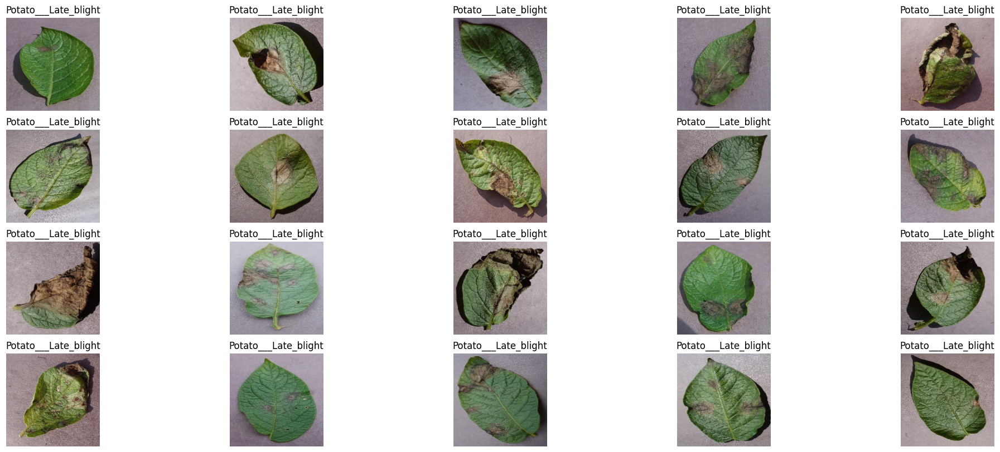

In [ ]:
# Define the path to the dataset and the class folder
dataset_dir = os.path.join(path, 'PlantVillage')
class_dir = 'Potato___Late_blight'
class_path = os.path.join(dataset_dir, class_dir)

# Get the first 20 image filenames
image_files = os.listdir(class_path)[:20]

# Plot the images
plt.figure(figsize=(25, 10))  # Adjusted figsize to accommodate 20 images
for i, image_file in enumerate(image_files):
    img_path = os.path.join(class_path, image_file)
    img = Image.open(img_path)
    plt.subplot(4, 5, i + 1)  # Adjusted subplot layout to 4 rows and 5 columns
    plt.imshow(img)
    plt.title(class_dir)
    plt.axis('off')
plt.show()

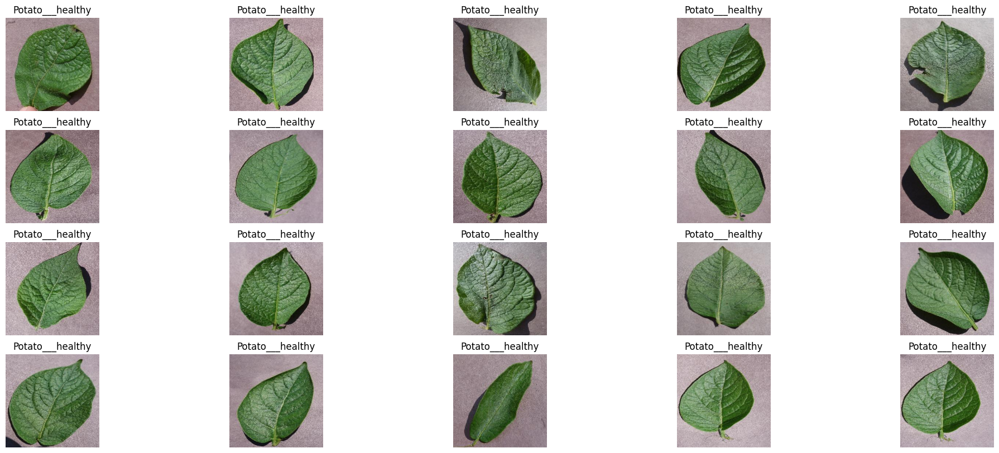

In [ ]:
# Define the path to the dataset and the class folder
dataset_dir = os.path.join(path, 'PlantVillage')
class_dir = 'Potato___healthy'
class_path = os.path.join(dataset_dir, class_dir)

# Get the first 20 image filenames
image_files = os.listdir(class_path)[:20]

# Plot the images
plt.figure(figsize=(25, 10))  # Adjusted figsize to accommodate 20 images
for i, image_file in enumerate(image_files):
    img_path = os.path.join(class_path, image_file)
    img = Image.open(img_path)
    plt.subplot(4, 5, i + 1)  # Adjusted subplot layout to 4 rows and 5 columns
    plt.imshow(img)
    plt.title(class_dir)
    plt.axis('off')
plt.show()

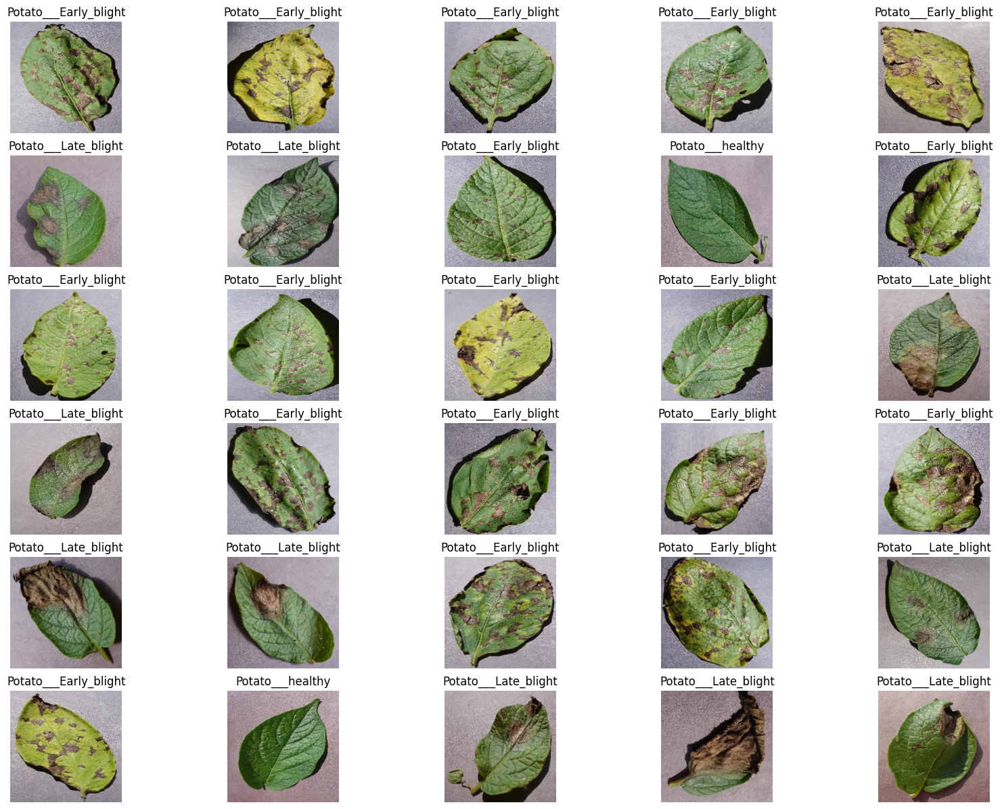

In [ ]:
# Define the path to the dataset and the class folders
dataset_dir = os.path.join(path, 'PlantVillage')
classes = ['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

# Collect image paths from all folders
all_image_paths = []
for class_dir in classes:
    class_path = os.path.join(dataset_dir, class_dir)
    image_files = os.listdir(class_path)
    for image_file in image_files:
        all_image_paths.append(os.path.join(class_path, image_file))

# Randomly select 30 image paths
random_image_paths = random.sample(all_image_paths, 30)

# Plot the images
plt.figure(figsize=(20, 15))
for i, img_path in enumerate(random_image_paths):
    img = Image.open(img_path)
    plt.subplot(6, 5, i + 1)  # 6 rows and 5 columns
    plt.imshow(img)
    class_name = os.path.basename(os.path.dirname(img_path))
    plt.title(class_name)
    plt.axis('off')
plt.show()

In [ ]:
# Define the paths
base_dir = os.path.join(path, 'PlantVillage')

# Initialize ImageDataGenerator for training and validation sets
train_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input,
    validation_split=0.2,  # Split 20% for validation
    horizontal_flip=True,
    zoom_range=0.3,
    shear_range=0.3,
    rotation_range=40,
    width_shift_range=0.3,
    height_shift_range=0.3,
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input,
    validation_split=0.2
)
# Lets Load the Training and Validation Data

In [ ]:
# Load the training set
train_generator = train_datagen.flow_from_directory(
    base_dir,
    target_size=(300, 300),  # Adjusted target size for EfficientNetB3
    batch_size=16,
    class_mode='categorical',
    subset='training'
)

# Load the validation set
validation_generator = val_datagen.flow_from_directory(
    base_dir,
    target_size=(300, 300),  # Adjusted target size for EfficientNetB3
    batch_size=16,
    class_mode='categorical',
    subset='validation'
)

Found 1722 images belonging to 3 classes.
Found 430 images belonging to 3 classes.


In [ ]:
# Get class indices from the training generator
class_indices = train_generator.class_indices
class_labels = list(class_indices.keys())

# Calculate class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)

class_weights_dict = dict(enumerate(class_weights))
print("Class weights:", class_weights_dict)

# Load the EfficientNetB3 model pre-trained on ImageNet
base_model = EfficientNetB3(weights='imagenet', include_top=False, input_shape=(300, 300, 3))
# Add custom layers on top of EfficientNetB3
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(3, activation='softmax')(x)  # Assuming 3 classes: Early_blight, Late_blight, healthy

# Define the complete model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze all layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Set up early stopping, model checkpoint, and learning rate reduction
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True, save_weights_only=False)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=15, min_lr=1e-6)
# Train the model with class weights and early stopping
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    epochs=50,
    class_weight=class_weights_dict,
    callbacks=[early_stopping, checkpoint, reduce_lr]
)


Class weights: {0: np.float64(0.7175), 1: np.float64(0.7175), 2: np.float64(4.704918032786885)}
Epoch 1/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 613s 6s/step - accuracy: 0.6261 - loss: 0.9069 - val_accuracy: 0.9062 - val_loss: 0.3487 - learning_rate: 1.0000e-04
Epoch 2/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 141s 1s/step - accuracy: 1.0000 - loss: 0.3785 - val_accuracy: 0.9038 - val_loss: 0.3520 - learning_rate: 1.0000e-04
Epoch 3/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 562s 5s/step - accuracy: 0.8755 - loss: 0.2959 - val_accuracy: 0.9303 - val_loss: 0.2438 - learning_rate: 1.0000e-04
Epoch 4/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - accuracy: 0.8750 - loss: 0.4217 - val_accuracy: 0.9207 - val_loss: 0.2509 - learning_rate: 1.0000e-04
Epoch 5/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 552s 5s/step - accuracy: 0.9123 - loss: 0.2198 - val_accuracy: 0.8990 - val_loss: 0.2513 - learning_rate: 1.0000e-04
Epoch 6/50
107/107 ━━━━━━━━━━━━━━━━━━━━ 122s 1s/step - accuracy: 0.9375 - loss: 0.3100 - val_accuracy: 0.8918 - val_los

In [ ]:
# Evaluate the model
loss, accuracy = model.evaluate(validation_generator)
print(f'Validation loss: {loss}')
print(f'Validation accuracy: {accuracy}')


27/27 ━━━━━━━━━━━━━━━━━━━━ 130s 5s/step - accuracy: 0.9286 - loss: 0.2313
Validation loss: 0.2500377595424652
Validation accuracy: 0.9232558012008667


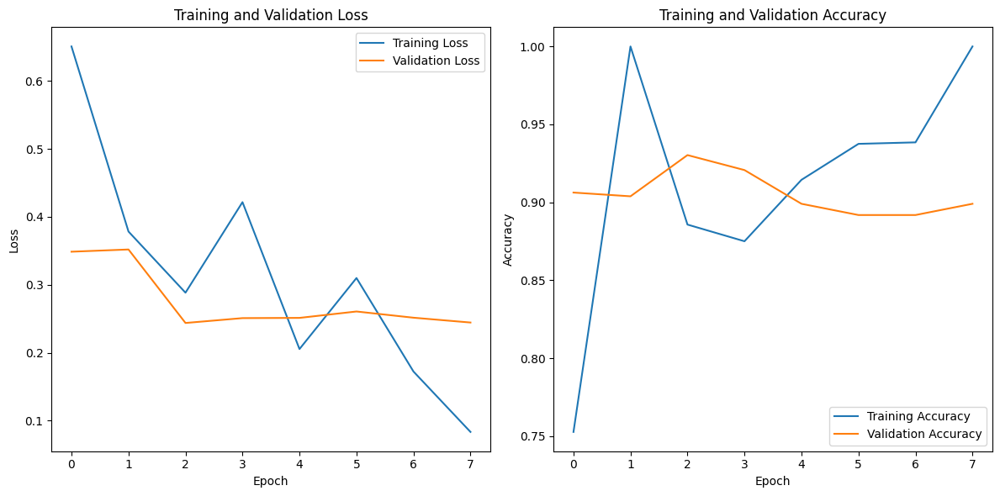

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
# Load the best saved model
model = load_model('best_model.keras')


In [ ]:
def load_and_preprocess_image(img_path, target_size=(300, 300)):
    # Load the image
    img = load_img(img_path, target_size=target_size)
    # Convert the image to array
    img_array = img_to_array(img)
    # Expand dimensions to match the shape of model input
    img_array = np.expand_dims(img_array, axis=0)
    # Preprocess the image using the same function used in training
    img_array = tf.keras.applications.efficientnet.preprocess_input(img_array)
    return img_array


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

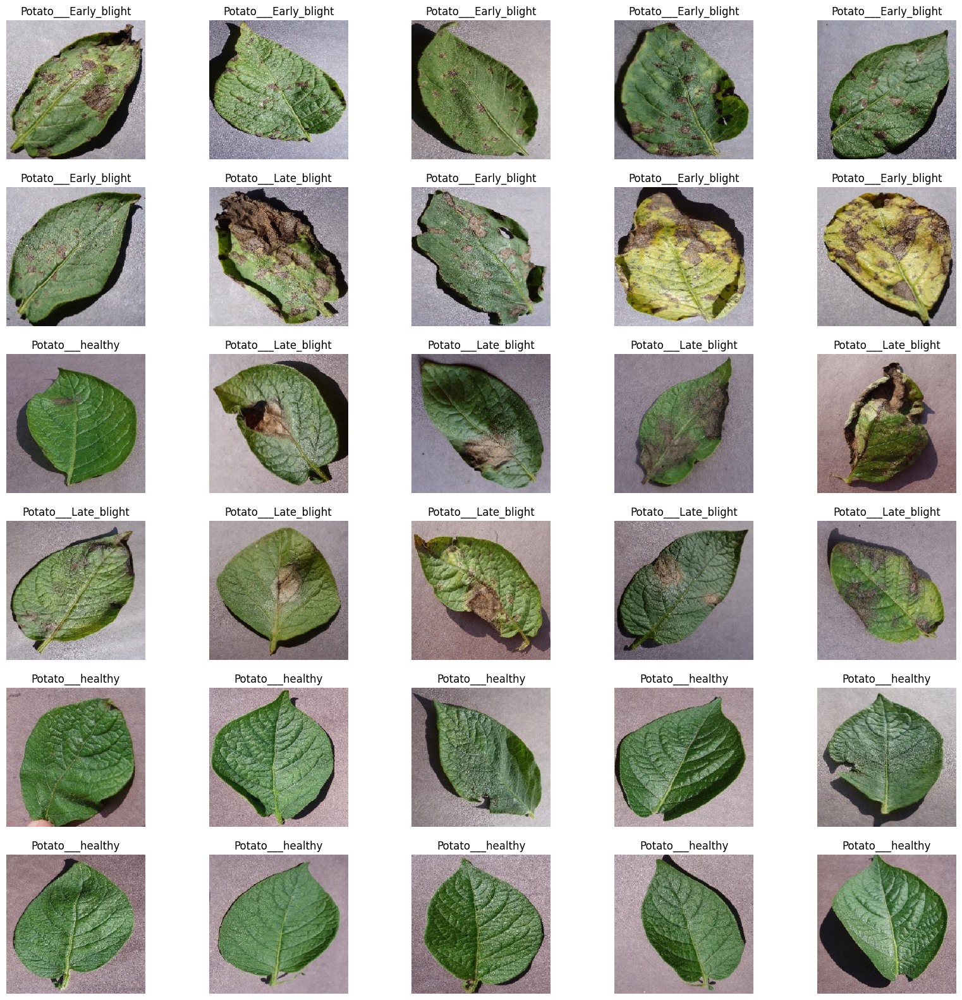

In [ ]:
# Define the path to the dataset and the class folders
base_dir = '/kaggle/input/plantvillage-potato-disease-dataset/PlantVillage'
classes = ['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

# Collect some image paths from all folders
image_paths = []
for class_dir in classes:
    class_path = os.path.join(base_dir, class_dir)
    image_files = os.listdir(class_path)[:10]  # Change this to any number of images you want
    for image_file in image_files:
        image_paths.append(os.path.join(class_path, image_file))
        # Predict and display images with predicted labels
plt.figure(figsize=(20, 20))
for i, img_path in enumerate(image_paths):
    img_array = load_and_preprocess_image(img_path)
    prediction = model.predict(img_array)
    predicted_class = class_labels[np.argmax(prediction)]

    # Load the original image for display
    img = load_img(img_path, target_size=(300, 300))

    plt.subplot(6, 5, i + 1)
    plt.imshow(img)
    plt.title(predicted_class)
    plt.axis('off')

plt.show()
